# Pilot preliminary analysis

The pilot data was analyzed after the preregistration of the study (Sept. 30th, 2022) and before any data for the main experiment were recorded.

We used partially different stimuli in the pilot experiment compared to the main study. Mainly we recorded additional scenes to further disentangle the expected "potential for action/change" ratings and the visual saliency. Hence, we replaced for example scenes containing only a single object (for example `waterglass`) with visually more interesting scenes. 

The pilot study had 4 participants, from which 3 completed all 8 blocks and 1 only completed 6 blocks. In the main experiment we excluded the data of participants who did not complete all 8 blocks.

The main aim of this pilot analysis was to get a feeling for the data and the effect size. We confirmed that the preregistered number of participants of 20 is sufficient to detect a difference between the first 5 seconds of the *static image* and *frozen video* conditions (during which the stimuli are visually identical). 

We determined a lower bound for the sample size by computing 90% power contours as a function of sample size and trial number (Baker et al., 2021) using the online tool https://shiny.york.ac.uk/powercontours/

In [39]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cv2
import pickle
from pymatreader import read_mat
from skimage.transform import resize

pd.set_option('display.max_columns', None)

## Pilot eye tracking data preprocessing

The data from the main experiment was parsed with `parse_LPA_5s.py`. For the pilot data, the following code was used, which results in a different output format. 

In [ ]:
def transform_x(input, video_min=192, video_max=1728, target_min=0, target_max=1920):
    try:
        num = float(input)
    except ValueError:
        return np.NaN
    num = float(input)
    # check if x val exceeds boundaries of the video 
    if (video_max <= num) or (num < video_min):
        return np.NaN
    else:
        return (num - video_min + target_min) * target_max / (video_max - video_min + target_min)

def transform_y(input, video_min=108, video_max=972, target_min=0, target_max=1080):
    try:
        num = float(input)
    except ValueError:
        return np.NaN
    num = float(input)
    # check if val exceeds boundaries of the video 
    if (video_max <= num) or (num < video_min):
        return np.NaN
    else:
        return (num - video_min + target_min) * target_max / (video_max - video_min + target_min)
    
DATA_PATH = "/home/nico/tubCloud/LPA_upload/pilots/"
asc_files = sorted([f for f in os.listdir(DATA_PATH) if ".asc" in f])
mat_files = sorted([f for f in os.listdir(DATA_PATH) if (".mat" in f) and ('trialinfo' not in f)])

assert len(asc_files) == len(mat_files), "Some files are missing!"

df_res = pd.DataFrame()

for subj_i in range(len(asc_files)):
    #### MAT dataframe
    mat_path = DATA_PATH + mat_files[subj_i] #"/home/nico/tubCloud/LPA_upload/pilots/LPA01_1.mat"
    data = read_mat(mat_path)
    dom_eye = data['setting']['eye_used']
    if dom_eye==0:
        dom_eye = 'left'
    elif dom_eye==1:
        dom_eye = 'right'
    else:
        raise Exception('Dominant eye has to be 0 or 1!')
    data = data['data']['b']['trial']
    # starting_block = int(mat_path[-5:-4])
    print(mat_files[subj_i][:-4])#, starting_block)

    df_mat = pd.DataFrame()
    for b in range(len(data)):
        df = pd.DataFrame(data[b])
        df['fix_control_x'] = [transform_x(val[[0]]) for val in data[b]['fix_pos']]
        df['fix_control_y'] = [transform_y(val[[1]]) for val in data[b]['fix_pos']]
        # For later analysis keep more, but for pilot now they are not important...
        cols = ['ask', 'question', 'answers',
                'correct', 'ans1', 'nr_iteration', 
                'moviename', 'video_file_exists', 'moviedata', 'all_tex',
                'frame_dur', 'imagename', 'image_file_exists', 'video_scale_factor',
                'v_width', 'v_height', 'video_dest_rect', 'fix_pos', 'n_frames',
                'n_flips', 'do_escape', 'fixReq', 'fixaOn', 'fixStart', 'fixBrokenCntr',
                'fixBrokenTime', 'fixEnd', 'x', 'y', 't', 't_eye', 't_flip_first',
                't_all_frames', 't_flip_last', 't_flip_image', 't_flip_first_video',
                'dropped', 'calib_result', 't_question_on', 'resp', 't_resp', 'rt',
                'rt_lastflip']
        for col_name in cols:
            df.drop(col_name, axis=1, inplace=True)
        df_mat = pd.concat([df_mat, df], ignore_index=True)

    
    ### ASC dataframe
    asc_path = DATA_PATH + asc_files[subj_i]

    df_asc = pd.DataFrame()
    with open(asc_path) as asc:
        content = asc.readlines()
        trial_starts = [[i, line] for i, line in enumerate(content) if ("TRIAL_Start" in line)]
        # find trial ends to avoid t+1 below?
        for t, trial_line in enumerate(trial_starts):
            d = {}
            d['study'] = 'LPA_pilot'
            d['subject_id'] = asc_path[-8:-6]
            d['dom_eye'] = dom_eye
            starting_block = int(asc_path[-5:-4])
            # d['starting_block'] = starting_block
            [trial_lidx, trial_message] = trial_line
            if t+1<len(trial_starts):
                [next_trial_lidx, _] = trial_starts[t+1]
            else:
                next_trial_lidx = -1
            assert int(trial_message.split(" ")[-1]) == t+1, "Trial index is not trial number"
            trialCnt = t+1
            d['asc_trialCnt'] = trialCnt
            # assert "TRIAL_in_BLOCK" in content[trial_lidx-1], "TRIAL_in_BLOCK not before TRIAL_Start"
            # assert "BLOCK" in content[trial_lidx-2], "BLOCK not before TRIAL_Start"
            # current_block = int(content[trial_lidx-2].split(" ")[-1])
            if "TRIAL_in_BLOCK" in content[trial_lidx-1]:
                current_trial_in_block = int(content[trial_lidx-1].split(" ")[-1])
                idx_shift = 0
            elif "TRIAL_in_BLOCK" in content[trial_lidx-2]:
                current_trial_in_block = int(content[trial_lidx-2].split(" ")[-1])
                idx_shift = 1
            else:
                raise Exception("TRIAL_in_BLOCK is not above trial start!")
            if "BLOCK" in content[trial_lidx-2-idx_shift]:
                current_block = int(content[trial_lidx-2-idx_shift].split(" ")[-1])
            elif "BLOCK" in content[trial_lidx-3-idx_shift]:
                current_block = int(content[trial_lidx-3-idx_shift].split(" ")[-1])
            else:
                raise Exception("BLOCK is not above trial start!")
                
            # this is only necessary for pilot, should be fixed in the experimental code now?!
            # TODO: check! and add stimulus name as message to trial!
            d['asc_block'] = starting_block - 1 + current_block
            assert 1<= d['asc_block'] <=8, "Invalid block number!"
            d['asc_trial_in_block'] = current_trial_in_block
            # print(d['asc_block'], d['asc_trialCnt'], d['asc_trial_in_block'])
            # only consider data between the boundaries of the current trial
            trial_data = content[trial_lidx:next_trial_lidx]
            # filter for all events that correspond to the first image being flipped
            image_events = [[i, line] for i, line in enumerate(trial_data) if ("EVENT_image" in line)]
            if len(image_events)==0:
                d['t_imageStart'] = np.NaN
                # d['t_imageEnd'] = np.NaN
                d['time_ms_im1'] = []
                d['X_left_im1'] = []
                d['Y_left_im1'] = []
                d['Pupil_left_im1'] = []
                d['X_right_im1'] = []
                d['Y_right_im1'] = []
                d['Pupil_right_im1'] = []
            else:
                assert 3<=len(image_events)<=4, "4 times in image, 3 times in video trials!"
                # print(len(image_events), image_events)
                d['t_imageStart'] = float(image_events[1][1].split('_')[-1])
                # d['t_imageEnd'] = float(image_events[3][1].split('_')[-1])
                # assert d['t_imageEnd'] > d['t_imageStart'], "Timing sanity check"
                image_data = trial_data[image_events[0][0]:image_events[2][0]]
                valid_trial_data = [line.split('\t')[:-1] for line in image_data if line.split('\t')[0].isdigit()]
                
                d['time_ms_im1'] = [int(row[0]) for row in valid_trial_data] 
                d['X_left_im1'] = [transform_x(row[1]) for row in valid_trial_data]
                d['Y_left_im1'] = [transform_y(row[2]) for row in valid_trial_data]
                d['Pupil_left_im1'] = [float(row[3]) for row in valid_trial_data]
                d['X_right_im1'] = [transform_x(row[4]) for row in valid_trial_data]
                d['Y_right_im1'] = [transform_y(row[5]) for row in valid_trial_data]
                d['Pupil_right_im1'] = [float(row[6]) for row in valid_trial_data]
            # append to result df
            df_temp = pd.DataFrame([d])
            df_asc = pd.concat([df_asc, df_temp], ignore_index=True)
    ### combine both!
    df_sub = pd.concat([df_asc, df_mat], axis=1)
    print(len(df_mat), len(df_asc), sum(df_sub['asc_trial_in_block'] == df_sub['trial']))
    # append to big result
    df_res = pd.concat([df_res, df_sub], ignore_index=True)

df_res.to_pickle(f"{DATA_PATH}df_pilot_data.pkl")  
df_res


In [3]:
PILOT_DATA_PATH = "/home/nico/Downloads/LPApilot_df_pilot_data.pkl"
df_data = pd.read_pickle(PILOT_DATA_PATH)  
df_data.head()

,study,subject_id,dom_eye,asc_trialCnt,asc_block,asc_trial_in_block,t_imageStart,time_ms_im1,X_left_im1,Y_left_im1,Pupil_left_im1,X_right_im1,Y_right_im1,Pupil_right_im1,fileName,video,ans2,block,trial,trialCntr,fix_control_x,fix_control_y
0,LPA_pilot,01,right,1,1,1,1.663591e+09,"[1671157, 1671158, 1671159, 1671160, 1671161, ...","[1334.125, 1334.75, 1334.625, 1334.625, 1335.7...","[272.99999999999994, 272.99999999999994, 275.7...","[1783.0, 1776.0, 1776.0, 1780.0, 1780.0, 1782....","[1394.875, 1395.125, 1395.25, 1395.25, 1394.87...","[271.5, 271.5, 269.87499999999994, 269.8749999...","[1760.0, 1758.0, 1755.0, 1751.0, 1751.0, 1752....",work.png,0,[],1,1,1,1372.50,303.75
1,LPA_pilot,01,right,2,1,2,1.663591e+09,"[1682794, 1682795, 1682796, 1682797, 1682798, ...","[1769.75, 1769.625, 1769.625, 1769.75, 1769.5,...","[786.125, 786.5, 786.5, 786.625, 788.5, 788.62...","[1121.0, 1120.0, 1120.0, 1122.0, 1122.0, 1122....","[1775.25, 1775.25, 1775.75, 1775.875, 1775.875...","[769.125, 769.25, 770.75, 770.75, 770.625, 770...","[1066.0, 1066.0, 1066.0, 1063.0, 1063.0, 1064....",bed.png,0,[],1,2,2,1755.00,797.50
2,LPA_pilot,01,right,3,1,3,1.663591e+09,"[1693690, 1693691, 1693692, 1693693, 1693694, ...","[506.125, 505.5, 505.25000000000006, 505.625, ...","[164.75, 165.125, 165.0, 163.625, 162.5, 162.1...","[800.0, 801.0, 802.0, 802.0, 799.0, 797.0, 800...","[503.75, 503.75, 502.75000000000006, 501.62499...","[137.375, 137.0, 136.75, 136.62500000000003, 1...","[723.0, 723.0, 728.0, 731.0, 731.0, 731.0, 731...",toaster.png,0,[],1,3,3,518.75,157.50
3,LPA_pilot,01,right,4,1,4,1.663591e+09,"[1704552, 1704553, 1704554, 1704555, 1704556, ...","[79.375, 79.25000000000001, 78.99999999999999,...","[415.625, 413.5, 413.5, 412.875, 412.875, 413....","[1032.0, 1032.0, 1033.0, 1035.0, 1036.0, 1036....","[81.49999999999999, 81.62500000000001, 83.75, ...","[372.75, 372.75, 372.875, 372.875, 372.625, 37...","[983.0, 987.0, 987.0, 987.0, 988.0, 988.0, 987...",clock.png,0,[],1,4,4,91.25,431.25
4,LPA_pilot,01,right,5,1,5,1.663591e+09,"[1715481, 1715482, 1715483, 1715484, 1715485, ...","[1779.0, 1778.875, 1779.25, 1779.5, 1779.375, ...","[327.875, 328.75, 328.75, 328.75, 328.75, 328....","[949.0, 949.0, 949.0, 949.0, 949.0, 943.0, 943...","[1780.75, 1780.625, 1778.5, 1778.5, 1778.5, 17...","[353.875, 354.875, 354.625, 354.625, 355.0, 35...","[974.0, 974.0, 974.0, 974.0, 974.0, 973.0, 972...",change.png,0,MARBLES,1,5,5,1755.00,355.00


In [4]:
df_valid = df_data[np.isnan(df_data['t_imageStart'])==False]
# one pilot participant only completed 6 blocks
len(df_valid) == (3*8+6)*20 == 600

True

## Load potential for action/change annotations

Importantly, the "potential for action/change" ratings were not complete when the pilot data was recorded. For the pilot analysis only two labelers were used, one of which was the first author (excluded in the main analysis). 

In [33]:
# expert_list = glob.glob("/home/nico/project_code/LPA_study/ExpertRatings/*.csv")
expert_list = ['/home/nico/project_code/LPA_study/ExpertRatings/backup/Nico_ratings.csv', '/home/nico/project_code/LPA_study/ExpertRatings/Olga_ratings.csv']
df_pfa = pd.DataFrame()
for expert_str in expert_list:
    expert_name = expert_str.split('/')[-1][:-12]
    print(expert_name, expert_str)
    df_temp = pd.read_csv(expert_str, header=None, names=['scene', 'r0', 'r1', 'r2', 'r3'])
    df_temp['expert'] = expert_name
    df_pfa = pd.concat([df_pfa, df_temp], ignore_index=True)
df_pfa.loc[df_pfa['scene']=='conversation', 'scene'] = 'conversation0'
df_pfa

Nico /home/nico/project_code/LPA_study/ExpertRatings/backup/Nico_ratings.csv
Olga /home/nico/project_code/LPA_study/ExpertRatings/Olga_ratings.csv


,scene,r0,r1,r2,r3,expert
0,phone,1617,625,297,369,Nico
1,espresso,773,390,174,271,Nico
2,reindeers,327,701,582,293,Nico
3,sealion2,1703,710,77,92,Nico
4,chessBoard,889,517,184,178,Nico
...,...,...,...,...,...,...
176,teabagOut,1513,427,248,333,Olga
177,carStart,1679,388,106,143,Olga
178,snip,1183,44,552,449,Olga
179,bottleString,521,62,205,426,Olga


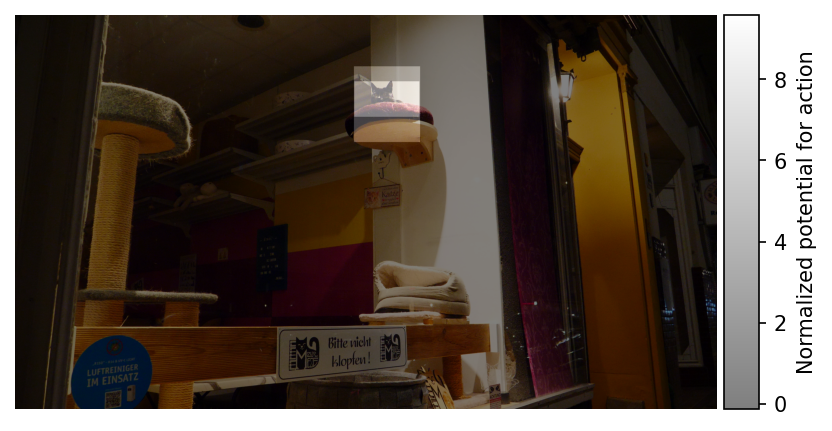

In [7]:
scene = 'catcafe'
#scene = 'monkey'
im_path = f"/home/nico/project_code/LPA_study/Stimuli/{scene}.png"
im = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(dpi=150)
ax.imshow(im)
pfa_mask = np.zeros((im.shape[0], im.shape[1]))
df_temp = df_pfa[df_pfa['scene']==scene]
for i in range(len(df_temp)):
    r = [int(df_temp.iloc[i][1]), int(df_temp.iloc[i][2]), int(df_temp.iloc[i][3]), int(df_temp.iloc[i][4])]
    pfa_mask[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] +=1
pfa_mask /= np.std(pfa_mask)
pfa_mask -= np.mean(pfa_mask)

pfa = ax.imshow(pfa_mask, alpha=0.5, cmap='gray')
ax.axis('off')
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pfa, cax=cax, orientation='vertical')
cb.set_label('Normalized potential for action', labelpad=5)
plt.show()



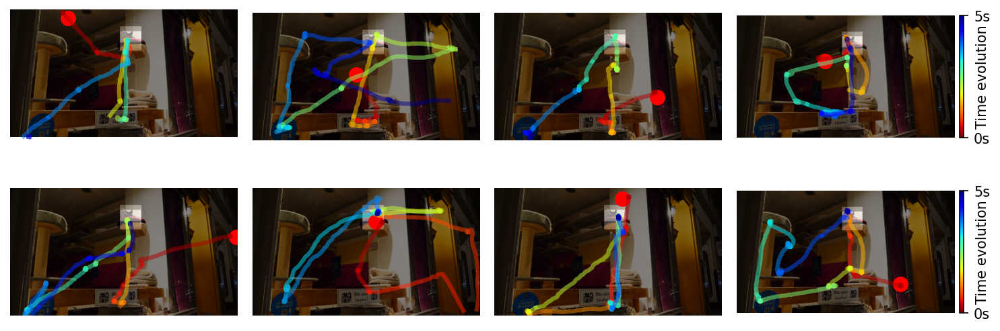

In [10]:
def plot_colorline(ax, x, y,colorbar=True, cmap = plt.cm.jet_r, **kwargs):
    #cmap = plt.cm.viridis
    nseg = 50
    N = len(x)
    xseg = np.linspace(0,N,nseg+1)
    for c,i0,i1 in zip(np.linspace(0.,1.,nseg), xseg[:-1], xseg[1:]):
        i0,i1 = int(round(i0)), int(round(i1))
        ax.plot( x[i0:i1+1], y[i0:i1+1], color=cmap(c), **kwargs)
    # colorbar
    if colorbar:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="2%", pad=0.05)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=1))
        sm._A = []
        cb = plt.colorbar(sm, cax=cax)
        cb.set_label('Time evolution', labelpad=-10)
        cb.set_ticks([0,1])
        cb.set_ticklabels( ['0s', '5s'])
        return cb

fig, axs = plt.subplots(2,4,dpi=150, figsize = (10,4))
ax.imshow(im)
pfa = ax.imshow(pfa_mask, alpha=0.5, cmap='gray')


df_imdata = df_valid[df_valid['fileName'] == f'{scene}.png']
for i in range(len(df_imdata)):
    dom_eye = df_imdata['dom_eye'].iloc[i]
    x = df_imdata[f'X_{dom_eye}_im1'].iloc[i]
    y = df_imdata[f'Y_{dom_eye}_im1'].iloc[i]
    t = df_imdata['time_ms_im1'].iloc[i]
    axs[0,i].imshow(im)
    axs[0,i].axis('off')
    axs[0,i].imshow(pfa_mask, alpha=0.5, cmap='gray')
    axs[0,i].scatter(df_imdata['fix_control_x'].iloc[i], df_imdata['fix_control_y'].iloc[i], 
                c='r', s=100)
    plot_colorline(axs[0,i], x,y, alpha=0.5, colorbar=(i==3), cmap=plt.cm.jet_r, lw=3) # (i==1)

df_viddata = df_valid[(df_valid['fileName'] == f'{scene}_s.mp4') | (df_valid['fileName'] == f'{scene}_m.mp4')]
for i in range(len(df_viddata)):
    dom_eye = df_viddata['dom_eye'].iloc[i]
    # get initial position
    x = df_viddata[f'X_{dom_eye}_im1'].iloc[i]
    y = df_viddata[f'Y_{dom_eye}_im1'].iloc[i]
    t = df_viddata['time_ms_im1'].iloc[i]
    axs[1,i].imshow(im)
    axs[1,i].axis('off')
    axs[1,i].imshow(pfa_mask, alpha=0.5, cmap='gray')
    axs[1,i].scatter(df_viddata['fix_control_x'].iloc[i], df_viddata['fix_control_y'].iloc[i], 
                c='r', s=100)
    plot_colorline(axs[1,i], x,y, alpha=0.5, colorbar=(i==3), cmap=plt.cm.jet_r, lw=3) # (i==1)
plt.tight_layout()
plt.show()

This qualitative analysis shows, that observers in the *static video* condition (lower row) tend to return to the cat / part of the scene with high potential for action/change towards the end of the 5 seconds when they can expect motion.

In [36]:
d_pfa = {}
# d_nss = {}
scenes = sorted([file[:-4] for file in df_valid.fileName.unique() if file.endswith('.png')])

for scene in scenes:
    # print(scene)
    d_pfa[scene] = {}
    # d_nss[scene] = {}
    # get PfA boxes and normalize the score
    pfa_mask = np.zeros((im.shape[0], im.shape[1]))
    df_temp = df_pfa[df_pfa['scene']==scene]
    for i in range(len(df_temp)):
        r = [int(df_temp.iloc[i][1]), int(df_temp.iloc[i][2]), int(df_temp.iloc[i][3]), int(df_temp.iloc[i][4])]
        pfa_mask[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] +=1
    pfa_mask /= np.std(pfa_mask)
    pfa_mask -= np.mean(pfa_mask)
    
    # if scene == 'conversation':
    #     scene_newname = 'conversation0'
    # else:
    #     scene_newname = scene
    # load NSS maps and resize
    # img_nss_map = resize(dict_nss_maps[scene_newname]['Image'], (im.shape[0], im.shape[1]), order=3)
    # vid_nss_map = resize(dict_nss_maps[scene_newname]['Video'], (im.shape[0], im.shape[1]), order=3)

    df_imdata = df_valid[df_valid['fileName'] == f'{scene}.png']
    df_viddata = df_valid[(df_valid['fileName'] == f'{scene}_s.mp4') | (df_valid['fileName'] == f'{scene}_m.mp4')]
    
    for s_id in df_valid.subject_id.unique():
        # print(s_id)
        df_s_im = df_imdata[df_imdata['subject_id']==s_id]
        df_s_vid = df_viddata[df_viddata['subject_id']==s_id]
        if len(df_s_im) != 1 or len(df_s_vid) != 1:
            d_pfa[scene][s_id] = np.nan
            # d_nss[scene][s_id] = np.nan
        else:
            dom_eye = df_imdata['dom_eye'].iloc[i]
            x_im = df_s_im[f'X_{dom_eye}_im1'].iloc[0]
            y_im = df_s_im[f'Y_{dom_eye}_im1'].iloc[0]
            x_vid = df_s_vid[f'X_{dom_eye}_im1'].iloc[0]
            y_vid = df_s_vid[f'Y_{dom_eye}_im1'].iloc[0]
            pfa_im = [np.NaN if np.isnan([y_im[t_i], x_im[t_i]]).any() else pfa_mask[int(y_im[t_i]), int(x_im[t_i])] for t_i in range(4800,len(x_im))]
            pfa_vid = [np.NaN if np.isnan([y_vid[t_i], x_vid[t_i]]).any() else pfa_mask[int(y_vid[t_i]), int(x_vid[t_i])] for t_i in range(4800,len(x_vid))]
            d_pfa[scene][s_id] = np.nanmean(pfa_vid) - np.nanmean(pfa_im)
            # nss_im = [np.NaN if np.isnan([y_im[t_i], x_im[t_i]]).any() else img_nss_map[int(y_im[t_i]), int(x_im[t_i])] for t_i in range(4800,len(x_im))]
            # nss_vid = [np.NaN if np.isnan([y_vid[t_i], x_vid[t_i]]).any() else vid_nss_map[int(y_vid[t_i]), int(x_vid[t_i])] for t_i in range(4800,len(x_vid))]
            # d_nss[scene][s_id] = np.nanmean(nss_vid) - np.nanmean(nss_im)
            

/tmp/ipykernel_28844/2551674385.py:44: RuntimeWarning: Mean of empty slice
  d_pfa[scene][s_id] = np.nanmean(pfa_vid) - np.nanmean(pfa_im)


In [40]:
# convert dictionaries to dataframe
df_pfa_effect = pd.DataFrame(d_pfa)
mean_pfa_effect = np.nanmean(df_pfa_effect)

df_pfa_effect['mean'] = df_pfa_effect.mean(axis=1)
df_pfa_effect.loc['mean'] = df_pfa_effect.mean(axis=0)

sd_scenes = df_pfa_effect.iloc[-1].std()
sd_sub = df_pfa_effect["mean"].std()

print(mean_pfa_effect, sd_scenes, sd_sub)

0.8004572305702483 1.5613964094625827 0.3697504407481305


https://shiny.york.ac.uk/powercontours/
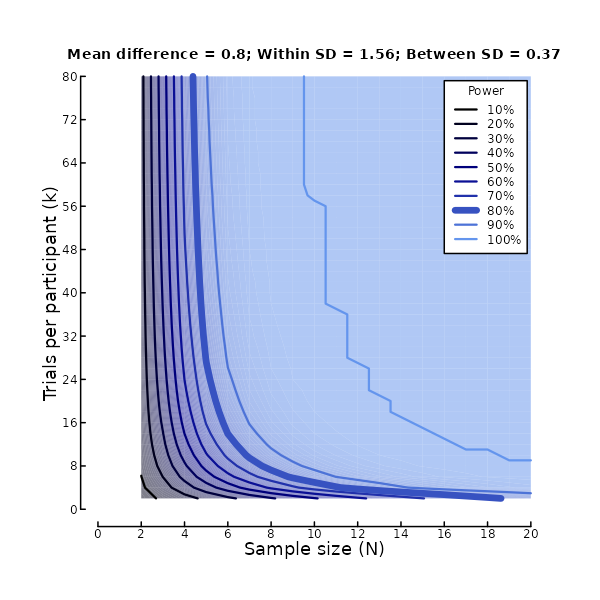

In [41]:
df_pfa_effect

,axolotl,axolotl2,ballBalance,bed,beer,bench,bigAnimalBackground,billboard,billboard2,bird,booting,candle,catcafe,change,chessBoard,chimpanzee,clock,clock2,coffeeOnSofa,conversation0,crossroad,crow,crowBall,elevatorEmpty,elevatorInside,elevatorWrongSide,espresso,fish,fly,giraffe,heron,hippo,kettle,kiosk,lake,laundry,lizard,mail,mokaPot,monitorLizard,monkey,monkey2,openDoorInside,openDoorOutside,paperball,pedestrian,phone,plank,receipt,reindeers,robot,robot2,sealion,sealion2,selfie,sheepBall,shoebill,shoot,sparkling,sparkling2,stapler,statues,throw,toaster,toytrain,toytrain2,trafficLight,trafficLight2,trash,ventilator,walkingDownStairs,walkingUpStairs,waterHose,waterbottle,waterglass,watering,work,work2,workingAlarm,yoga,mean
01,3.91778,0.000000e+00,1.905935,2.598890,0.000000,-0.037503,0.00000,-4.683816e+00,-2.048843,6.339517,-0.292647,0.000000,NaN,-1.269206e+00,3.332446,6.499980e+00,-1.545999,0.0,0.000000,3.375182e+00,-1.527046,0.000000,0.000000,0.000000,-0.968189,2.499760e+00,-3.725241,5.877167,-7.753598,-5.551115e-17,2.035987,-0.845824,0.000000,-1.102196,-3.448724,-2.763098,2.475093,0.000000,4.314431e+00,-3.115608,-4.943577,0.000000,5.551115e-17,0.000000,-1.603578,3.359119,-4.371224e+00,0.087067,0.000000,-4.072382,1.088654,-0.102925,2.839287e+00,2.775558e-17,0.000000,1.600093e+00,4.129366,0.000000,0.000000e+00,0.0,-5.551115e-17,0.340750,2.096253,-0.27558,3.292245,-1.721719,3.004543,0.000000,1.011574,-0.509067,-0.529322,0.000000,0.000000,0.000000e+00,1.327582e-01,2.228113,4.121757,1.110223e-16,0.000000,2.472628,0.300246
02,0.00000,2.775558e-17,NaN,-2.202015,NaN,NaN,NaN,-3.501268e+00,0.000000,NaN,NaN,0.000000,9.718405,1.911437e-01,2.611245,0.000000e+00,3.091997,NaN,NaN,NaN,4.927610,0.000000,NaN,0.000000,2.159806,9.033788e-01,NaN,NaN,11.149335,2.546923e+00,-0.010029,NaN,NaN,NaN,NaN,-0.373392,0.000000,0.000000,1.132697e+00,NaN,NaN,3.011236,NaN,-2.112488,-0.235107,-2.465560,1.614984e+00,NaN,0.000000,4.072382,2.339852,NaN,NaN,0.000000e+00,NaN,1.908259e+00,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,-3.440728,-1.410524,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,2.775558e-17,-5.551115e-17,NaN,NaN,4.690190e+00,NaN,NaN,1.007958
03,0.00000,5.420017e+00,-0.553416,2.598890,0.000000,0.000000,-1.91784,-2.775558e-17,0.000000,6.971052,3.452850,0.000000,9.718405,NaN,0.024746,2.775558e-17,2.621822,0.0,2.983942,0.000000e+00,0.117824,10.403138,-11.110962,2.130744,2.159806,-2.220446e-16,3.800499,1.751569,0.000000,1.063064e+00,-0.614828,0.222190,0.000000,0.208534,-2.449960,0.980153,0.000000,2.550674,5.141682e+00,1.126931,0.000000,0.000000,5.551115e-17,-2.122998,-1.808962,3.359119,5.551115e-17,0.579710,2.748403,0.000000,2.276882,4.620201,1.387779e-17,2.775558e-17,1.798563,-2.220446e-16,0.000000,0.000000,5.551115e-17,0.0,0.000000e+00,-0.806382,0.421306,NaN,-3.618314,-3.799011,2.098859,4.417605,6.069445,-2.675097,-4.671839,-3.986744,-2.099036,3.856209e+00,1.737940e-01,-4.956926,4.567352,0.000000e+00,1.832195,-2.587932,0.698563
04,3.91778,-2.775558e-17,1.715524,NaN,3.882139,0.000000,0.00000,0.000000e+00,2.412369,0.000000,-1.416554,4.893913,3.127210,-1.110223e-16,1.740830,6.499980e+00,1.020511,0.0,0.000000,5.551115e-17,1.787675,-3.740396,-2.448389,0.000000,0.000000,-4.578769e-01,3.800499,3.171343,11.432313,2.982484e+00,0.000000,3.332848,-1.486996,1.557871,3.448724,1.885628,-7.633111,3.863999,-2.775558e-17,4.160977,0.000000,-0.121067,-4.489857e+00,2.921750,0.000000,3.359119,2.185612e+00,1.124981,-0.739955,4.072382,2.802614,0.000000,0.000000e+00,2.775558e-17,3.053023,-2.014932e+00,4.129366,3.559317,2.722236e+00,0.0,2.154196e+00,4.462719,2.096253,0.00000,0.000000,0.318144,0.000000,4.417605,-5.753954,0.000000,2.335919,3.986744,8.833444,0.000000e+00,0.000000e+00,4.956926,-2.961996,2.441800e+00,0.000000,-0.903214,1.296208
mean,1.95889,1.355004e+00,1.022681,0.998588,1.294046,-0.012501,-0.63928,-2.046271e+00,0.090882,4.436856,0.581216,1.223478,7.521340,-3.593541e-01,1.927317,3.249990e+00,1.297083,0.0,0.994647,1.125061e+00,1.326516,1.665686,-4.519784,0.532686,0.837856,7.363156e

In [17]:
# pilot participant 02 only completed 6/8 blocks, where the two missing blocks were from the same condition
# so only half the trials can show an effect (i.e. difference between the two conditions)
np.isnan(df_pfa_effect.loc['02'].values[:-1]).sum()

40

## Preliminary coherence analysis

The following code was used to get an estimate for the coherence of the gaze data across participants. This is not how coherence was calculated for the main analysis, and only here to get a rough estimate.

In [ ]:
def gaussian_2d(x0, y0, xmax, ymax, xsig, ysig=None):
    """
    Function draws a 2D Gaussian on a frame with the dimensions of the video (xmax, ymax).
    x0, y0: center point of the Gaussian
    xsig: standard deviation of the Gaussian, used to be 7.3*DVA_TO_PX (cf. Schwetlick2020)
    ysig: default assumes to be the same as xsig
    """
    if not ysig:
        ysig = xsig
    X, Y = np.meshgrid(np.arange(0, xmax), np.arange(0, ymax))
    G = np.exp(-0.5 * (((X - x0) / xsig) ** 2 + ((Y - y0) / ysig) ** 2))
    return G


# load data
DATA_PATH = "/home/nico/tubCloud/LPA_upload/vss/"
df_data = pd.read_pickle(f"{DATA_PATH}df_vss_data.pkl")
df_valid = df_data[np.isnan(df_data["t_imageStart"]) == False]

imshape = [1080, 1920, 3]

nss_maps_nonorm = {}
count = 0
for scene in sorted(set(df_data.scene)):
    count += 1
    print(count, " of 80...")
    nss_maps_nonorm[scene] = {}
    # Images
    df_imdata = df_valid[df_valid["fileName"] == f"{scene}.png"]
    nss_small = np.zeros((imshape[0] // 4, imshape[1] // 4))
    for subj_i in range(11, len(df_imdata)):
        subject_id = df_imdata["subject_id"].iloc[subj_i]
        print("Image ", subject_id)
        dom_eye = df_imdata["dom_eye"].iloc[subj_i]
        x = df_imdata[f"X_{dom_eye}_im1"].iloc[subj_i]
        y = df_imdata[f"Y_{dom_eye}_im1"].iloc[subj_i]
        for i in range(len(x)):
            if np.isnan([x[i], y[i]]).any():
                continue
            else:
                nss_small += gaussian_2d(
                    x[i] / 4, y[i] / 4, nss_small.shape[1], nss_small.shape[0], 20
                )
    nss_small = (nss_small - np.mean(nss_small)) / np.std(nss_small)
    nss_maps_nonorm[scene]["Image"] = nss_small
    print(scene, "im done")
    # Videos
    df_viddata = df_valid[
        (df_valid["fileName"] == f"{scene}_s.mp4")
        | (df_valid["fileName"] == f"{scene}_m.mp4")
    ]
    nss_small = np.zeros((imshape[0] // 4, imshape[1] // 4))
    for subj_i in range(11, len(df_viddata)):
        subject_id = df_viddata["subject_id"].iloc[subj_i]
        print("Video ", subject_id)
        dom_eye = df_viddata["dom_eye"].iloc[subj_i]
        x = df_viddata[f"X_{dom_eye}_im1"].iloc[subj_i]
        y = df_viddata[f"Y_{dom_eye}_im1"].iloc[subj_i]
        for i in range(len(x)):
            if np.isnan([x[i], y[i]]).any():
                continue
            else:
                nss_small += gaussian_2d(
                    x[i] / 4, y[i] / 4, nss_small.shape[1], nss_small.shape[0], 20
                )
    nss_small = (nss_small - np.mean(nss_small)) / np.std(nss_small)
    nss_maps_nonorm[scene]["Video"] = nss_small
    print(scene, "vid done")

# store results
with open(
    "/home/nico/tubCloud/LPA_upload/LPApilot_dict_nss_maps.pkl", "wb",
) as handle:
    pickle.dump(nss_maps_nonorm, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [15]:
with open('/home/nico/Downloads/LPApilot_dict_nss_maps.pkl', 'rb') as handle:
    dict_nss_maps = pickle.load(handle)
dict_nss_maps.keys()


dict_keys(['axolotl', 'axolotl2', 'ballBalance', 'bed', 'beer', 'bench', 'bigAnimalBackground', 'billboard', 'billboard2', 'bird', 'booting', 'candle', 'catcafe', 'change', 'chessBoard', 'chimpanzee', 'clock', 'clock2', 'coffeeOnSofa', 'conversation0', 'crossroad', 'crow', 'crowBall', 'elevatorEmpty', 'elevatorInside', 'elevatorWrongSide', 'espresso', 'fish', 'fly', 'giraffe', 'heron', 'hippo', 'kettle', 'kiosk', 'lake', 'laundry', 'lizard', 'mail', 'mokaPot', 'monitorLizard', 'monkey', 'monkey2', 'openDoorInside', 'openDoorOutside', 'paperball', 'pedestrian', 'phone', 'plank', 'receipt', 'reindeers', 'robot', 'robot2', 'sealion', 'sealion2', 'selfie', 'sheepBall', 'shoebill', 'shoot', 'sparkling', 'sparkling2', 'stapler', 'statues', 'throw', 'toaster', 'toytrain', 'toytrain2', 'trafficLight', 'trafficLight2', 'trash', 'ventilator', 'walkingDownStairs', 'walkingUpStairs', 'waterHose', 'waterbottle', 'waterglass', 'watering', 'work', 'work2', 'workingAlarm', 'yoga'])

## Plot the individual pilot trials

We plot all trials including the preliminary calculations of the "potential for action/change" and coherence across participants. 

===== axolotl =====
Kept!


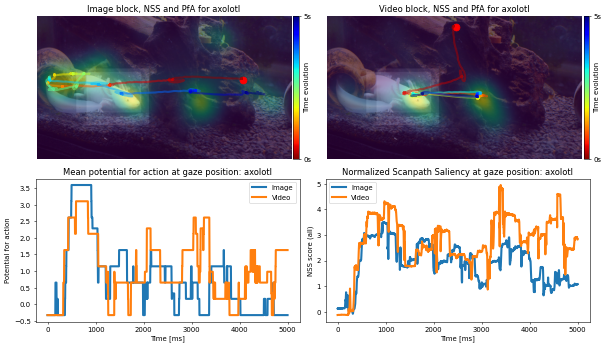

===== axolotl2 =====
Only in pilot!


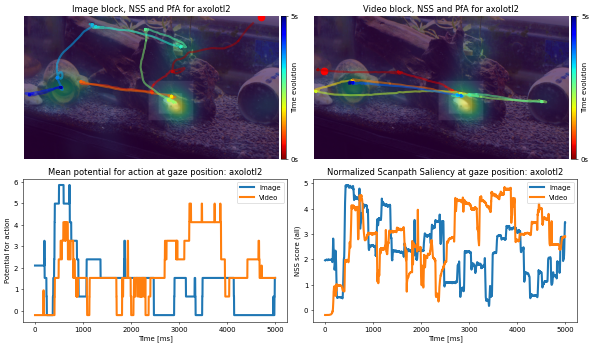

===== ballBalance =====
Kept!


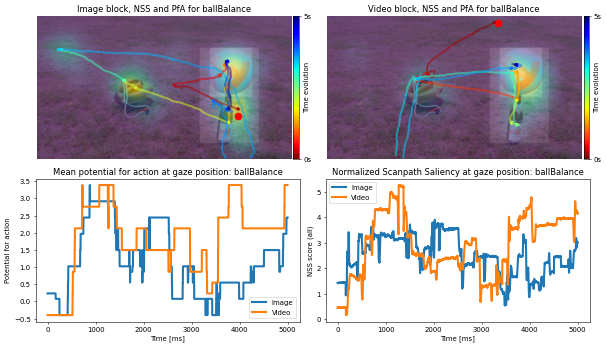

===== bed =====
Kept!


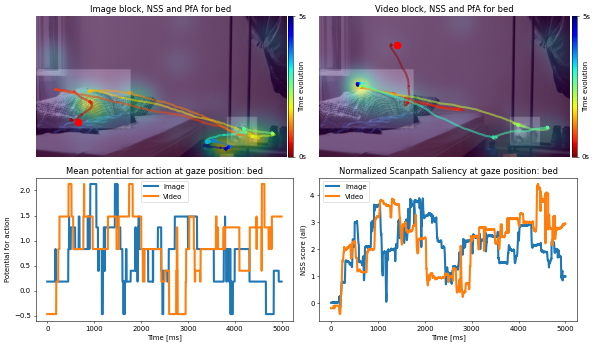

===== beer =====
Only in pilot!


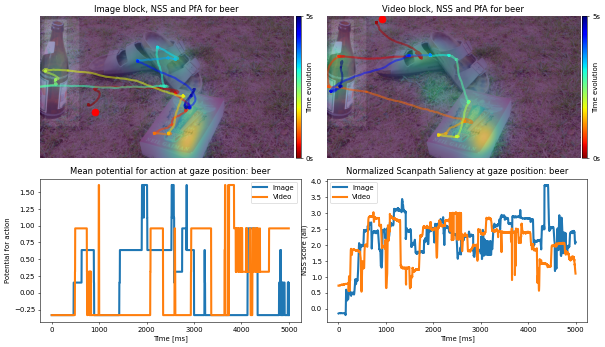

===== bench =====
Kept!


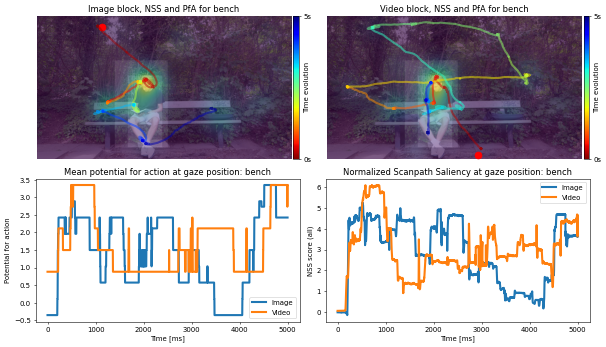

===== bigAnimalBackground =====
Kept!


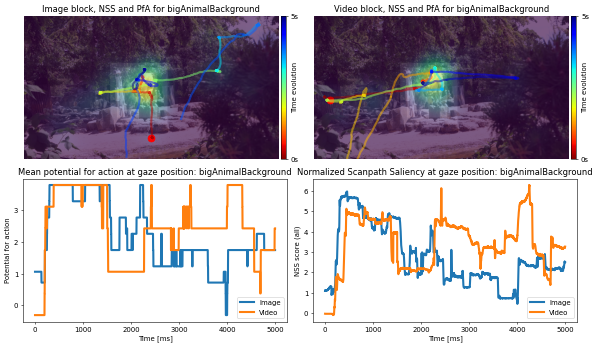

===== billboard =====
Kept!


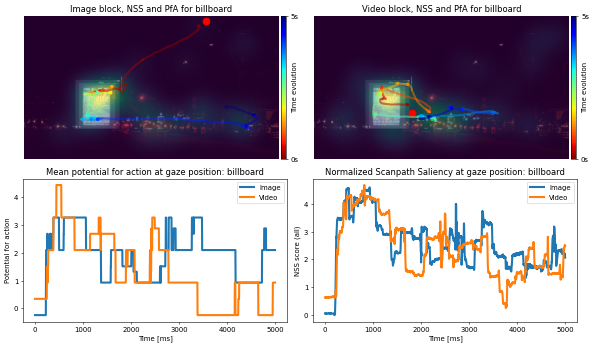

===== billboard2 =====
Only in pilot!


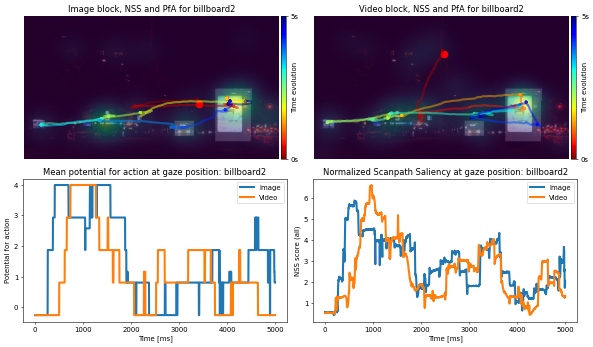

===== bird =====
Kept!


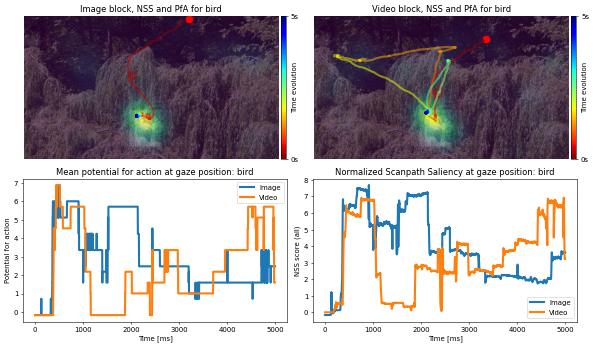

===== booting =====
Only in pilot!


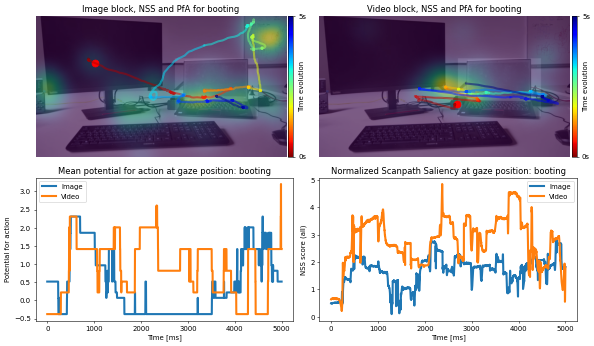

===== candle =====
Kept!


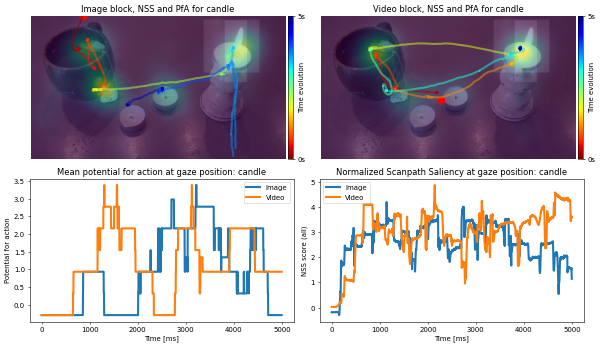

===== catcafe =====
Kept!


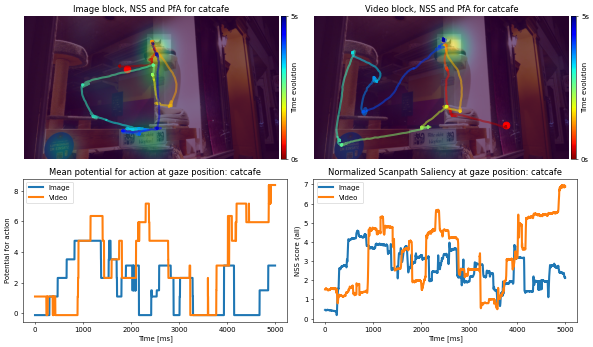

===== change =====
Only in pilot!


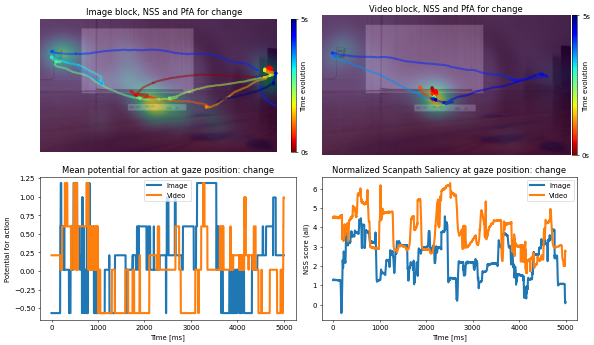

===== chessBoard =====
Kept!


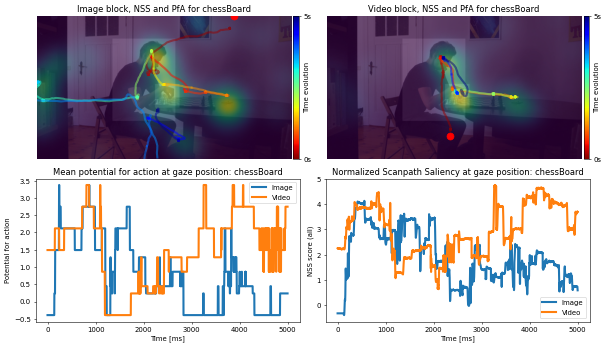

===== chimpanzee =====
Kept!


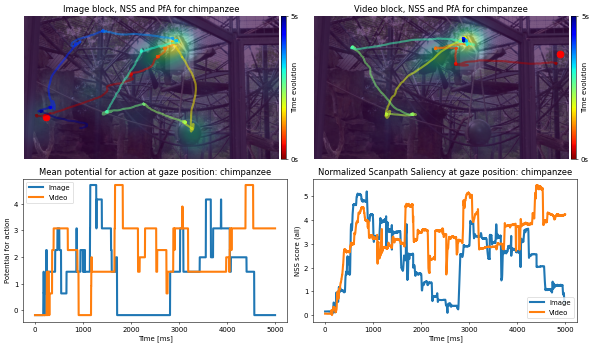

===== clock =====
Kept!


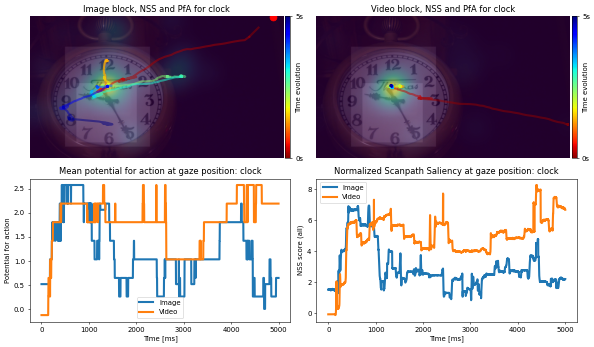

===== clock2 =====
Only in pilot!


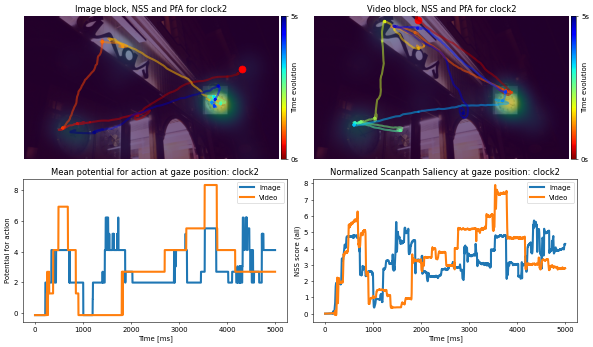

===== coffeeOnSofa =====
Kept!


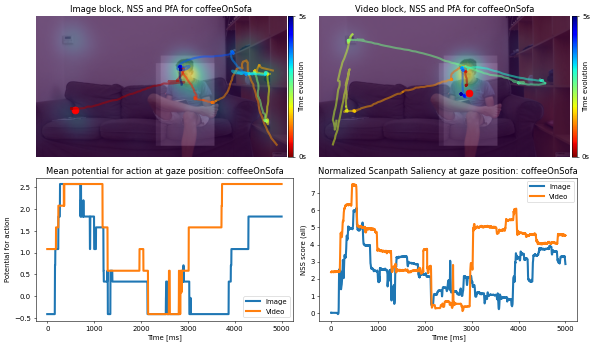

===== conversation =====
Kept!


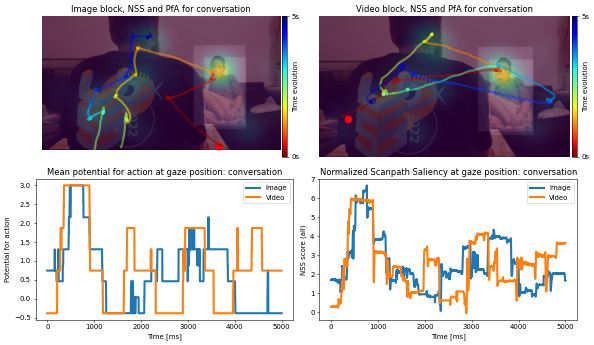

===== crossroad =====
Only in pilot!


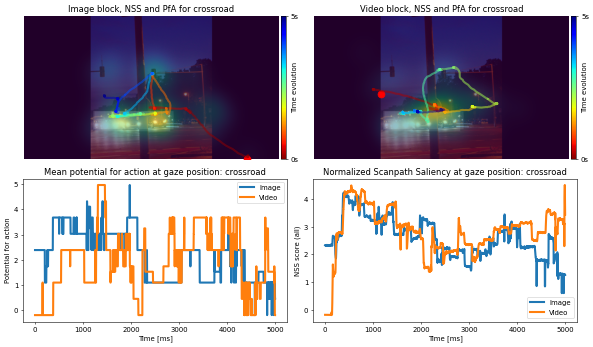

===== crow =====
Kept!


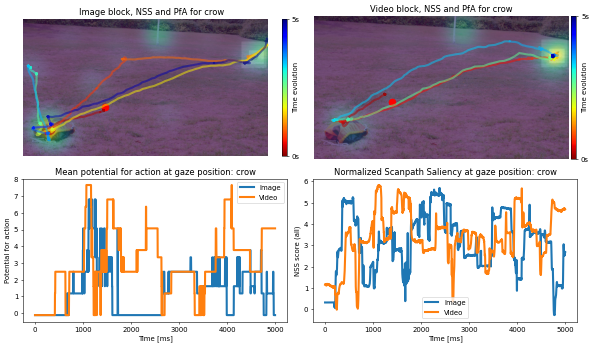

===== crowBall =====
Kept!


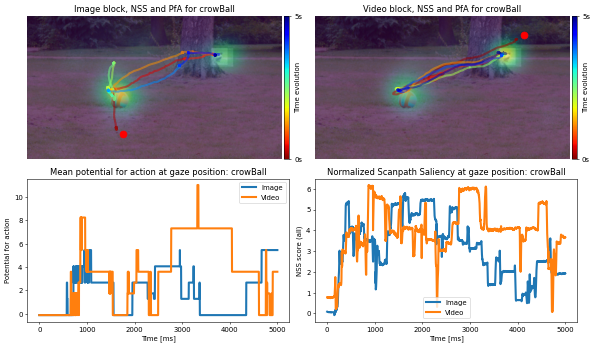

===== elevatorEmpty =====
Kept!


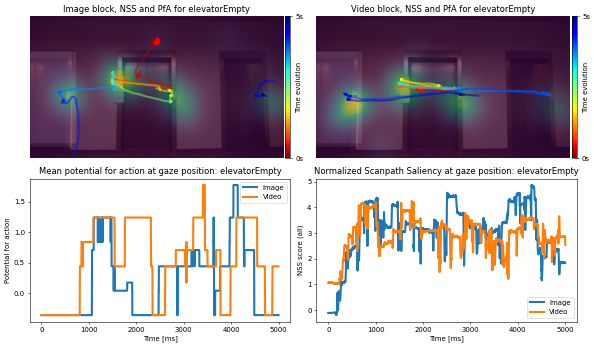

===== elevatorInside =====
Only in pilot!


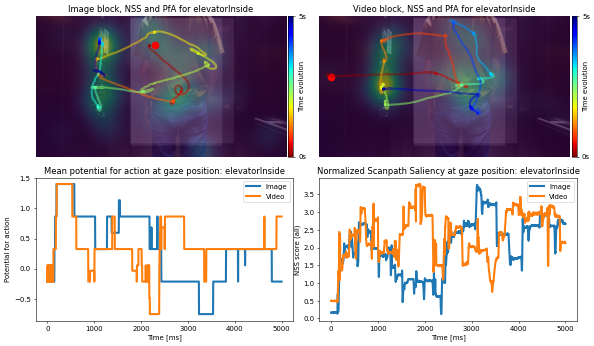

===== elevatorWrongSide =====
Kept!


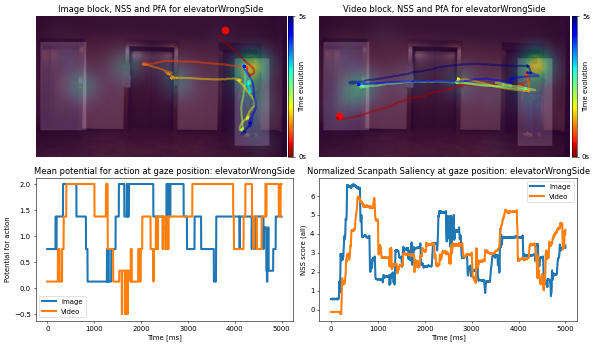

===== espresso =====
Kept!


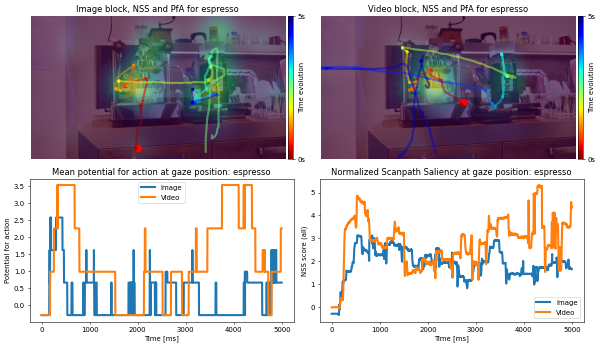

===== fish =====
Kept!


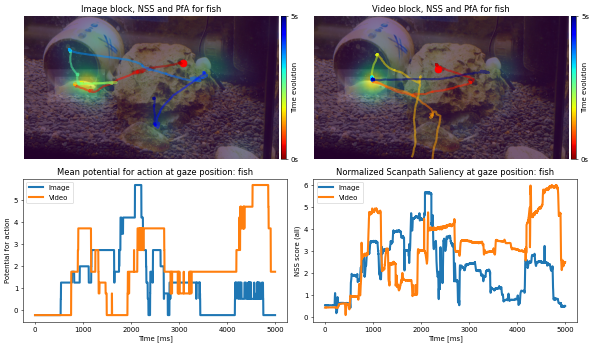

===== fly =====
Kept!


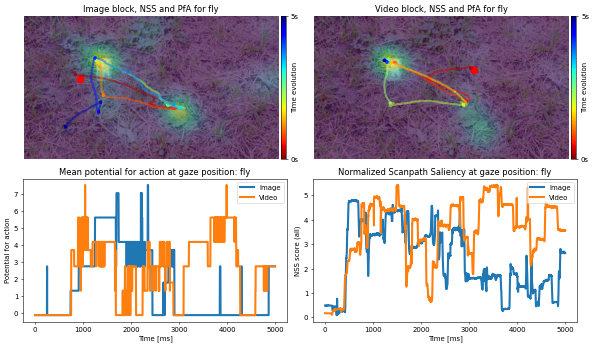

===== giraffe =====
Kept!


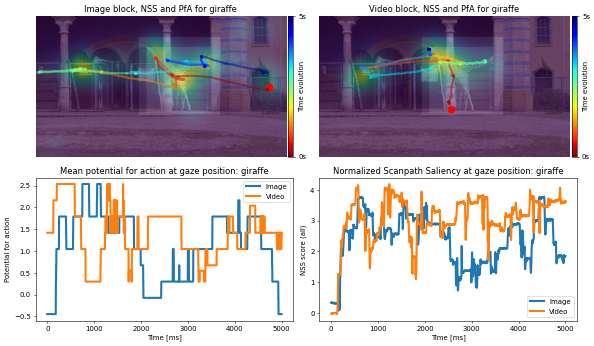

===== heron =====
Only in pilot!


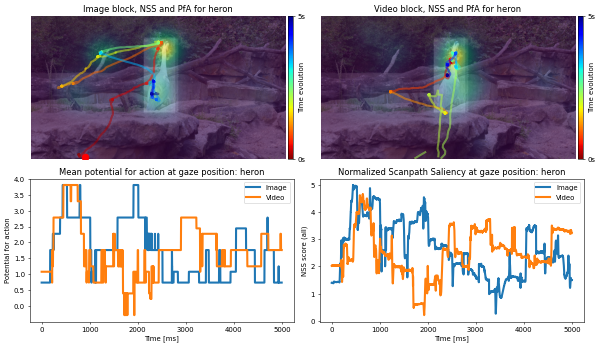

===== hippo =====
Kept!


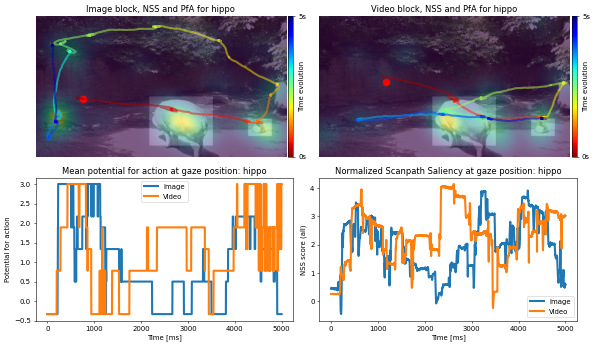

===== kettle =====
Kept!


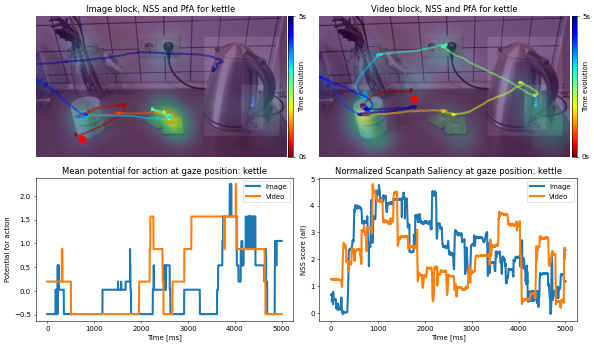

===== kiosk =====
Only in pilot!


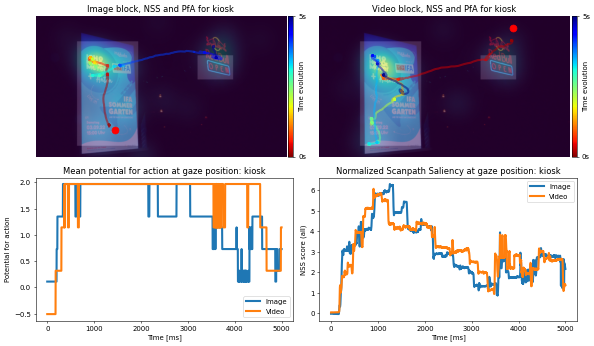

===== lake =====
Kept!


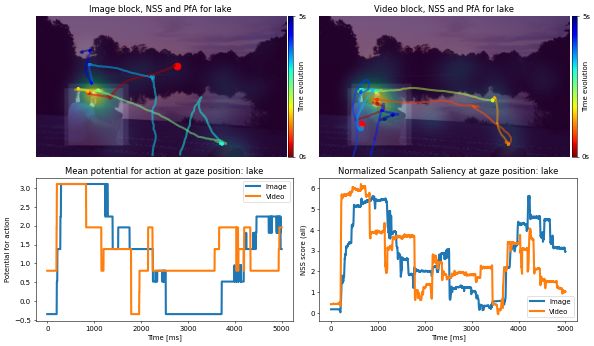

===== laundry =====
Kept!


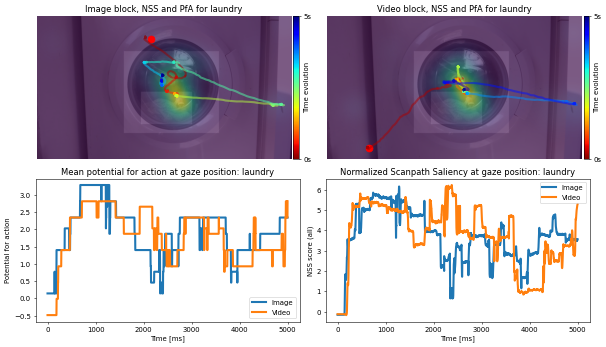

===== lizard =====
Kept!


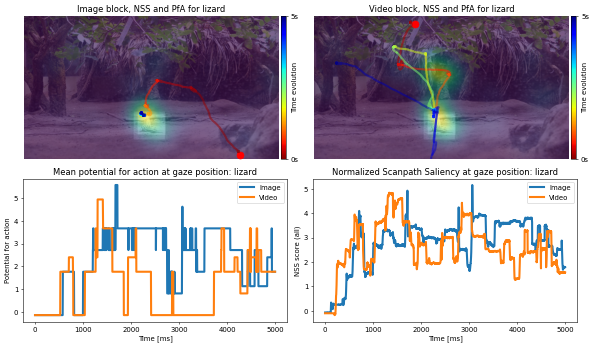

===== mail =====
Kept!


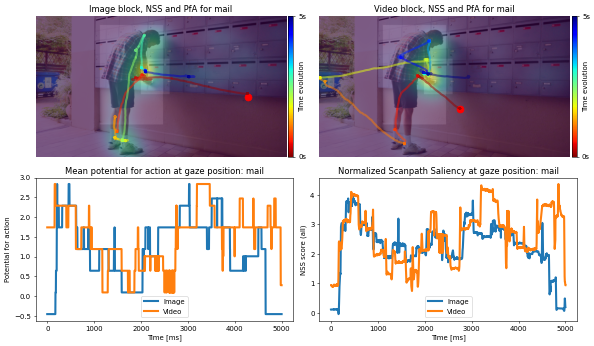

===== mokaPot =====
Kept!


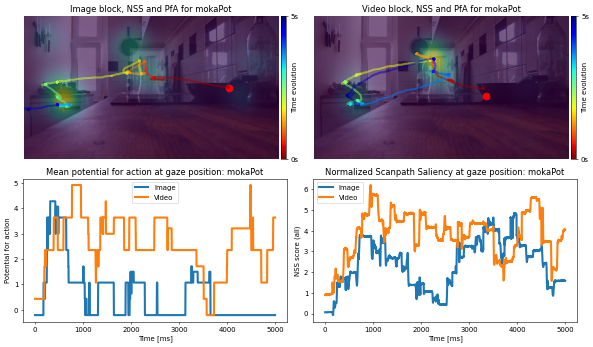

===== monitorLizard =====
Kept!


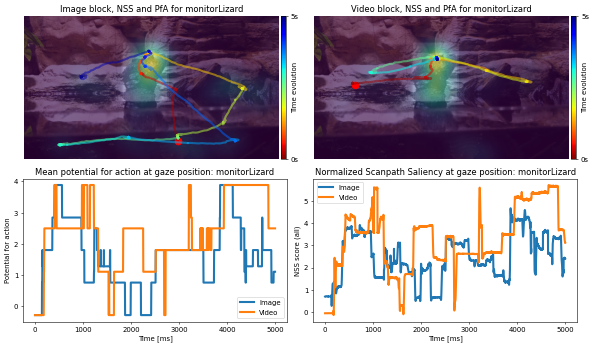

===== monkey =====
Only in pilot!


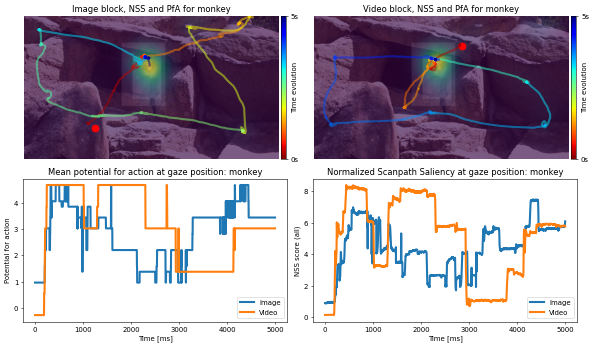

===== monkey2 =====
Kept!


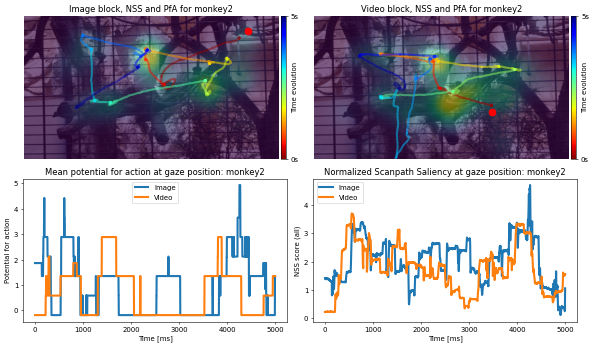

===== openDoorInside =====
Kept!


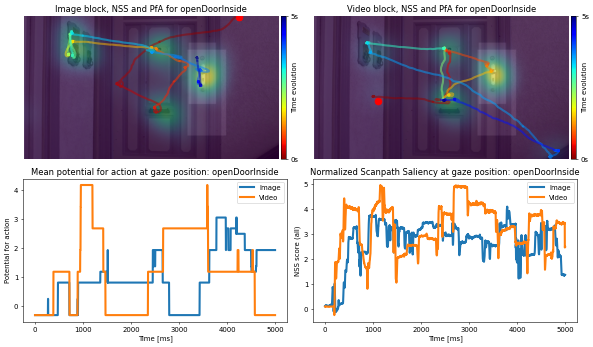

===== openDoorOutside =====
Kept!


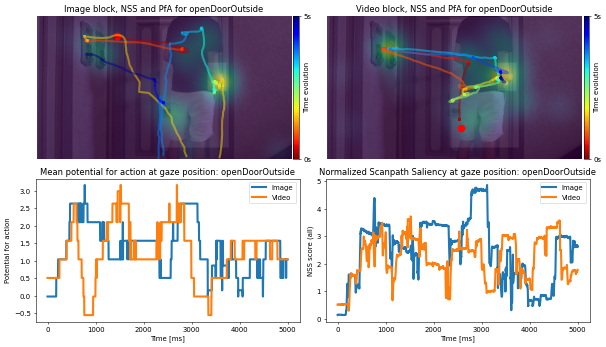

===== paperball =====
Only in pilot!


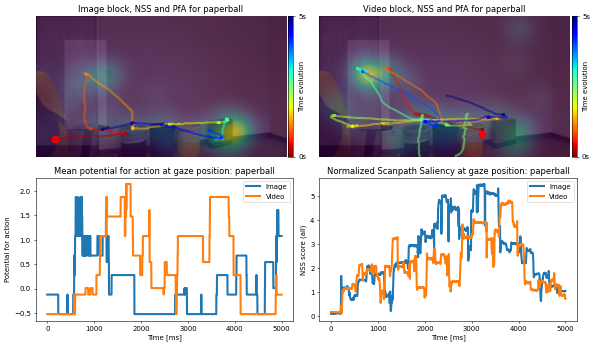

===== pedestrian =====
Kept!


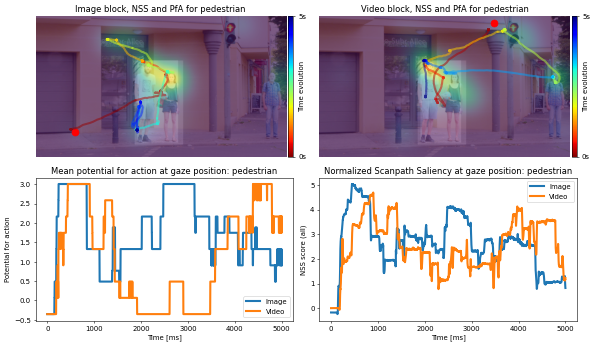

===== phone =====
Kept!


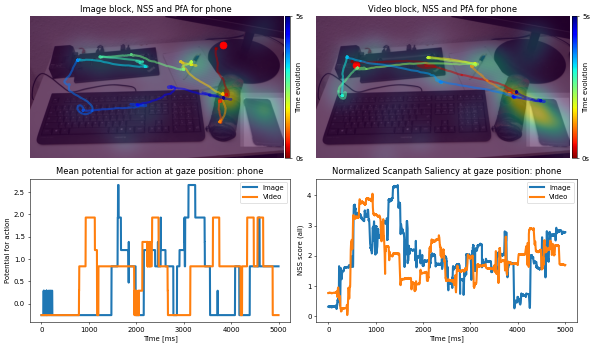

===== plank =====
Kept!


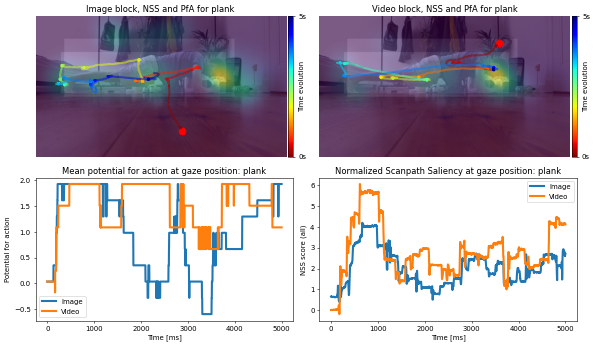

===== receipt =====
Kept!


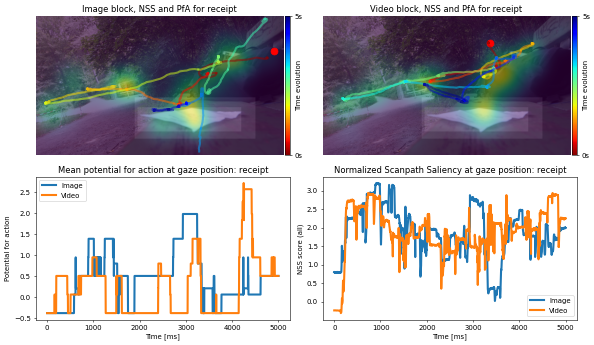

===== reindeers =====
Kept!


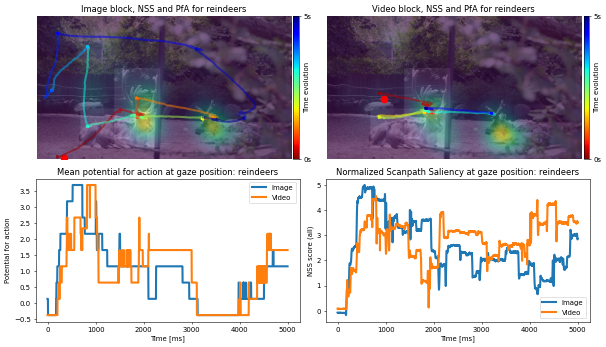

===== robot =====
Kept!


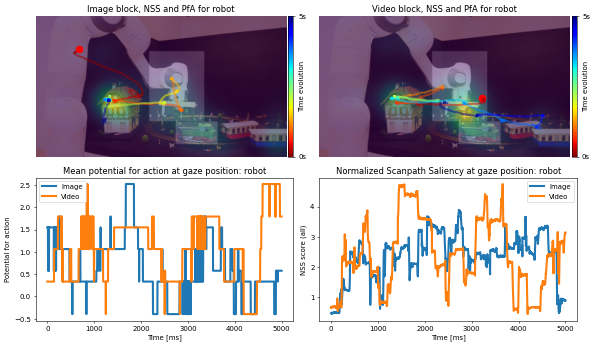

===== robot2 =====
Kept!


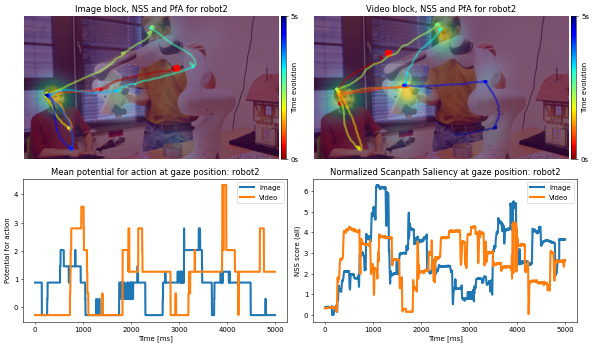

===== sealion =====
Kept!


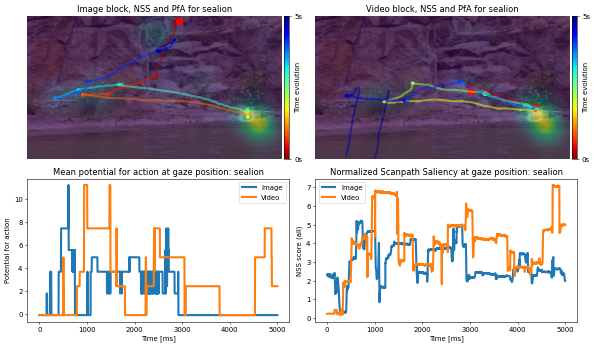

===== sealion2 =====
Only in pilot!


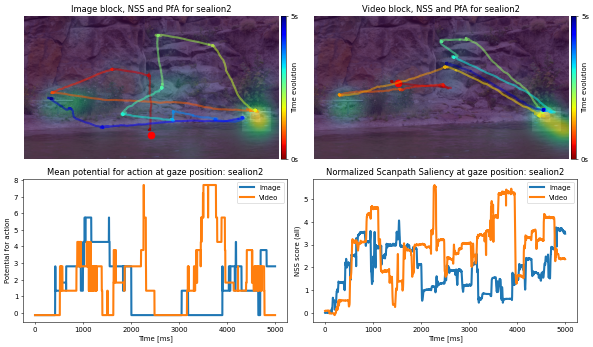

===== selfie =====
Kept!


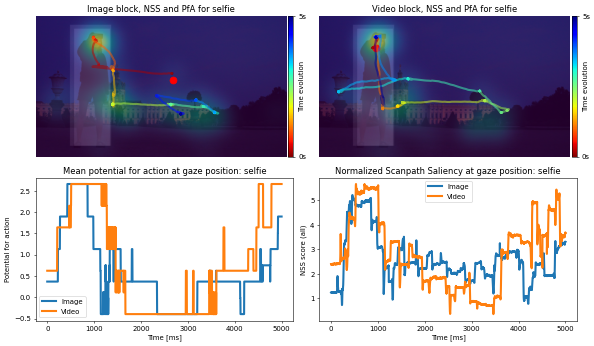

===== sheepBall =====
Only in pilot!


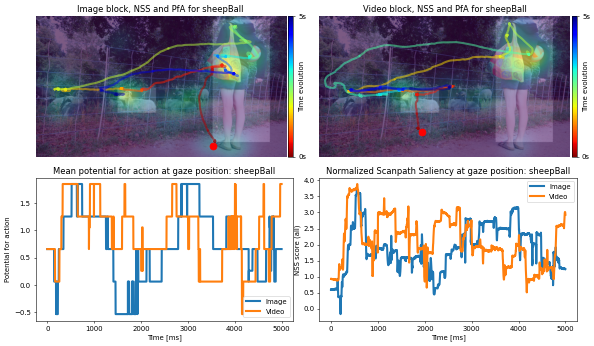

===== shoebill =====
Kept!


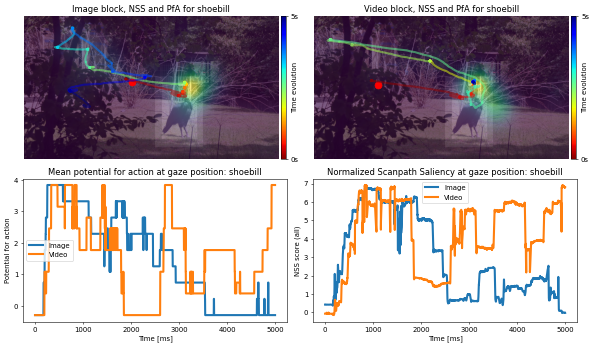

===== shoot =====
Kept!


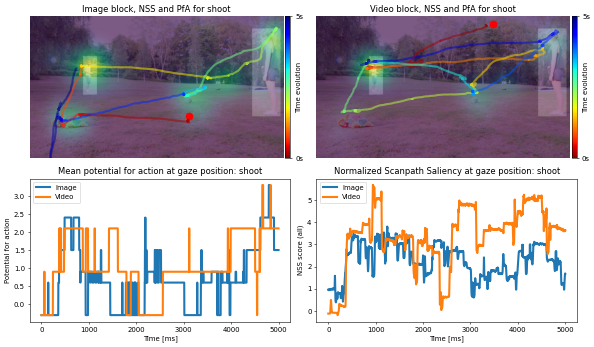

===== sparkling =====
Only in pilot!


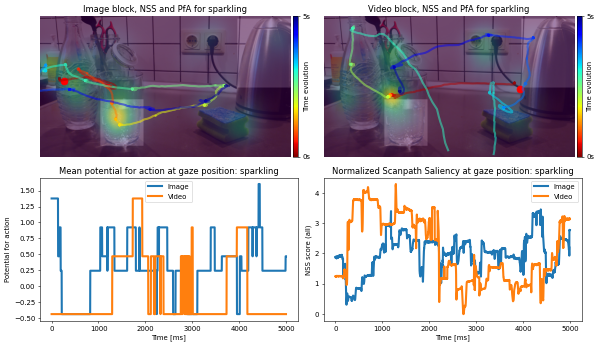

===== sparkling2 =====
Kept!


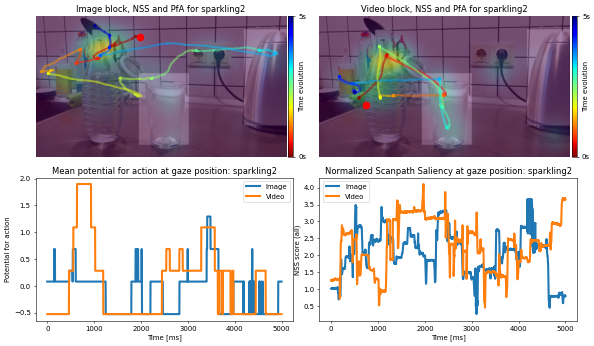

===== stapler =====
Kept!


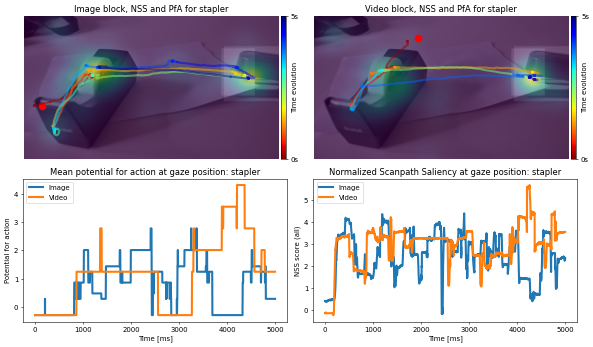

===== statues =====
Kept!


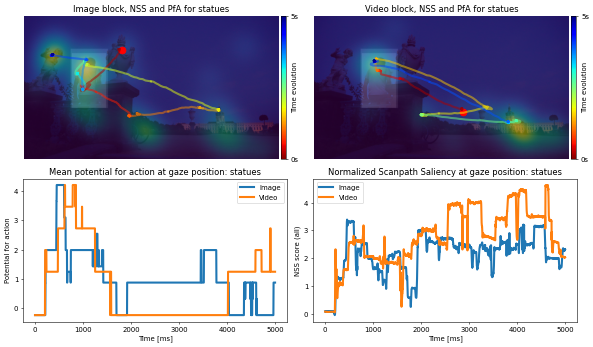

===== throw =====
Kept!


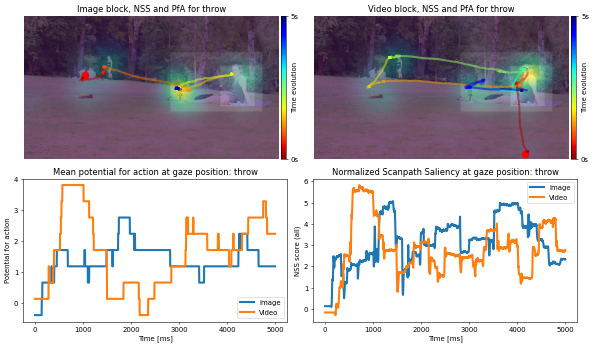

===== toaster =====
Kept!


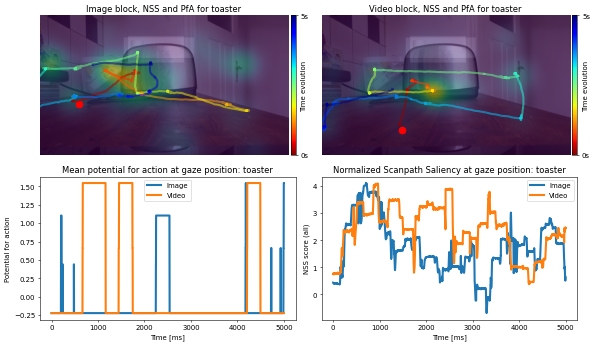

===== toytrain =====
Kept!


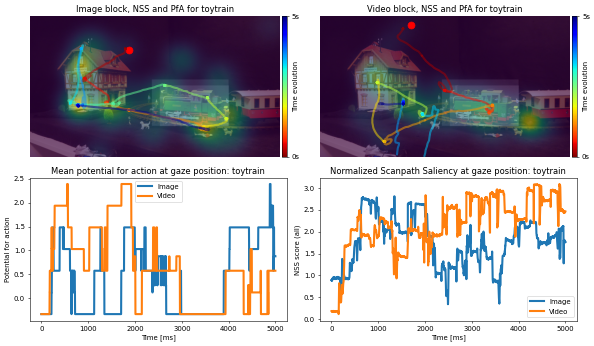

===== toytrain2 =====
Only in pilot!


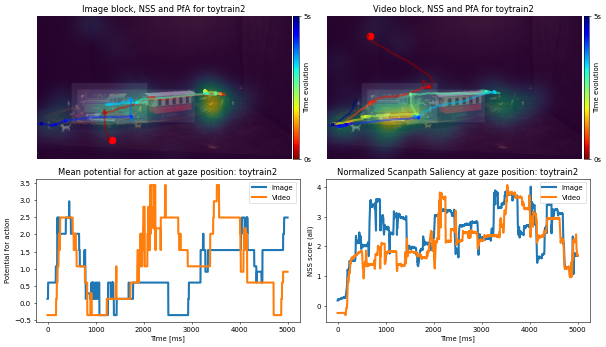

===== trafficLight =====
Kept!


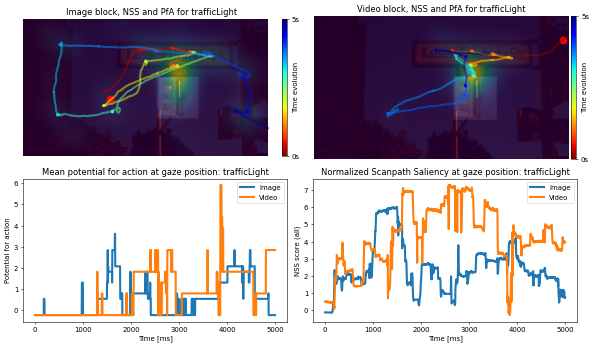

===== trafficLight2 =====
Kept!


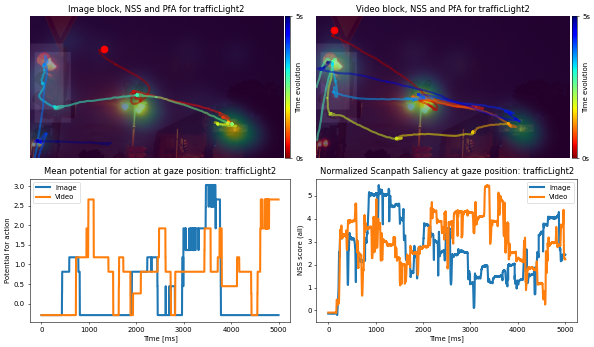

===== trash =====
Kept!


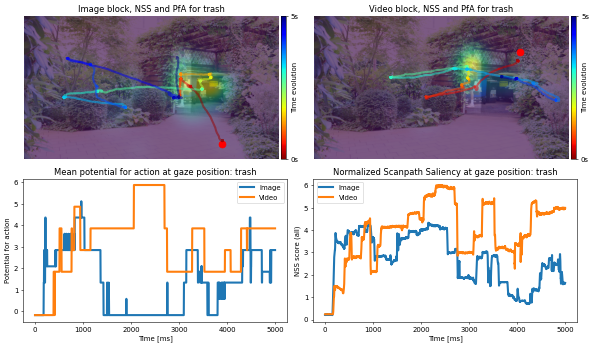

===== ventilator =====
Kept!


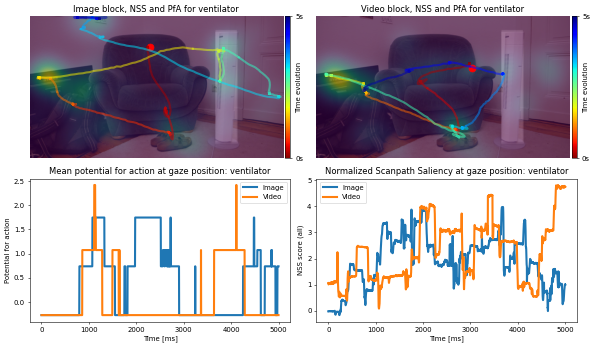

===== walkingDownStairs =====
Only in pilot!


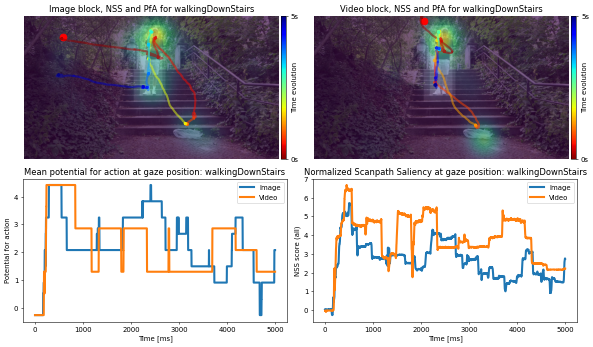

===== walkingUpStairs =====
Only in pilot!


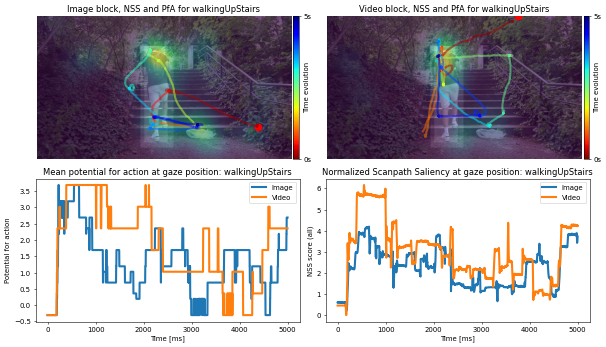

===== waterHose =====
Kept!


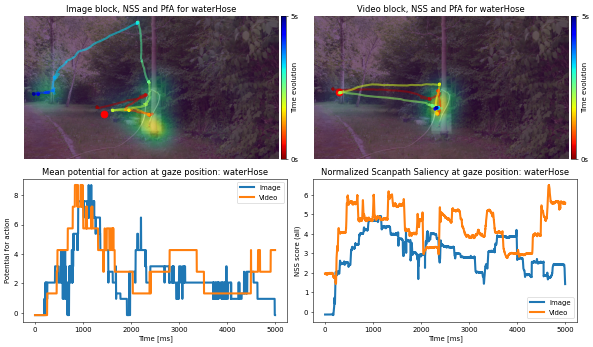

===== waterbottle =====
Kept!


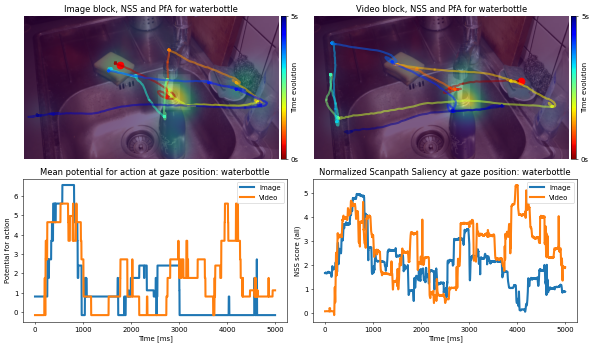

===== waterglass =====
Only in pilot!


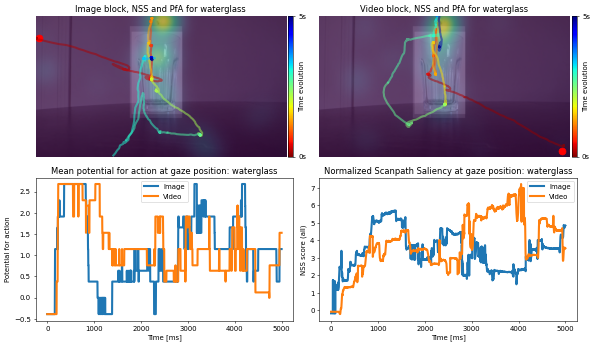

===== watering =====
Kept!


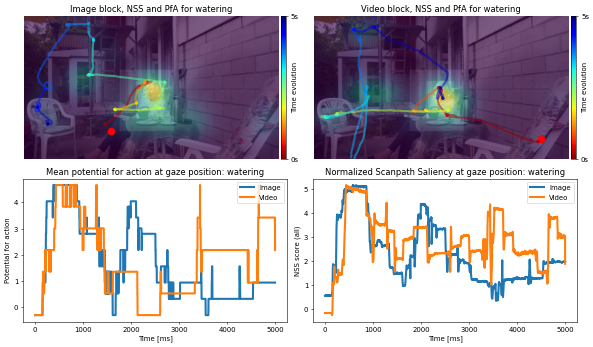

===== work =====
Kept!


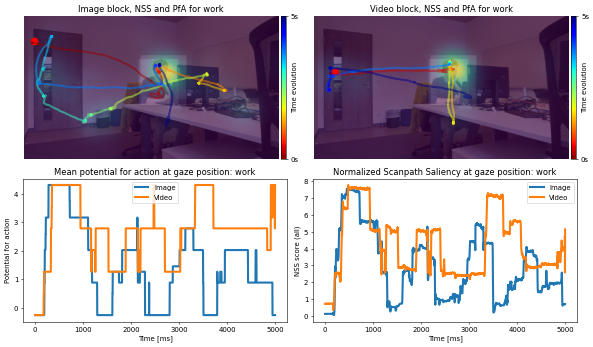

===== work2 =====
Kept!


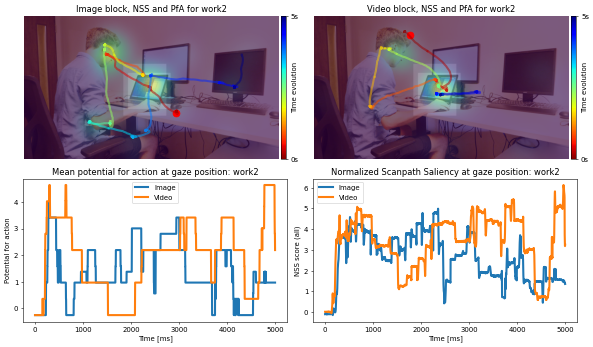

===== workingAlarm =====
Only in pilot!


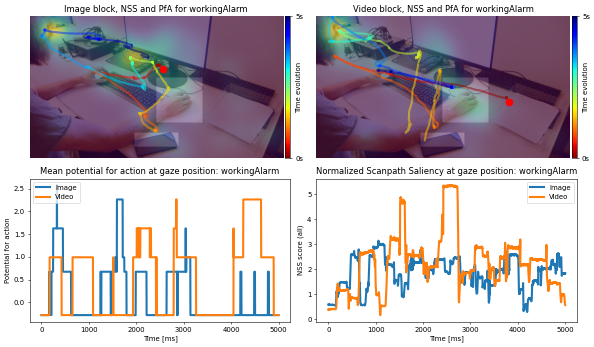

===== yoga =====
Kept!


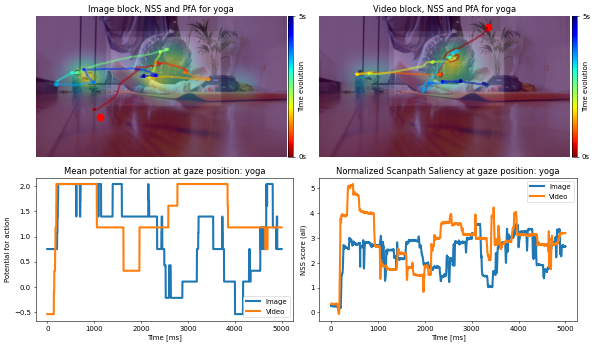

In [53]:
all_img_pfas_mean = []
all_vid_pfas_mean = []
all_img_nss_mean = []
all_vid_nss_mean = []
kept_img_pfas_mean = []
kept_vid_pfas_mean = []
kept_img_nss_mean = []
kept_vid_nss_mean = []

N = 5000

for scene in sorted(list(set(df_pfa.scene))):
    print(f'===== {scene} =====')
    if os.path.exists(f"/home/nico/project_code/LPA_study/Stimuli/{scene}.png"):
        im_path = f"/home/nico/project_code/LPA_study/Stimuli/{scene}.png"
        print('Kept!')
        kept_scene = True
    else:
        im_path = f"/home/nico/project_code/LPA_study/Stimuli/pilot_unused/{scene}.png"
        print('Only in pilot!')
        kept_scene = False

    im = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2RGB)
    fix, axs = plt.subplots(2,2, figsize=(12,7), dpi=50) # for plots, set DPI to 150!

    # get PfA boxes and normalize the score
    pfa_mask = np.zeros((im.shape[0], im.shape[1]))
    df_temp = df_pfa[df_pfa['scene']==scene]
    for i in range(len(df_temp)):
        r = [int(df_temp.iloc[i][1]), int(df_temp.iloc[i][2]), int(df_temp.iloc[i][3]), int(df_temp.iloc[i][4])]
        pfa_mask[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] +=1
    pfa_mask /= np.std(pfa_mask)
    pfa_mask -= np.mean(pfa_mask)
    # print(np.mean(pfa_mask), np.std(pfa_mask))
    
    # load NSS maps and resize
    if scene == 'conversation':
        scene_newname = 'conversation0'
    else:
        scene_newname = scene

    img_nss_map = resize(dict_nss_maps[scene_newname]['Image'], (im.shape[0], im.shape[1]), order=3)
    vid_nss_map = resize(dict_nss_maps[scene_newname]['Video'], (im.shape[0], im.shape[1]), order=3)
    
    # plot the images
    axs[0,0].imshow(im)
    axs[0,0].imshow(pfa_mask, alpha=0.3, cmap='gray')
    axs[0,0].imshow(img_nss_map, alpha=0.5)# 3, cmap='gray')
    axs[0,0].set_title(f'Image block, NSS and PfA for {scene}')
    axs[0,0].axis('off')
    # plt.colorbar()
    axs[0,1].imshow(im)
    axs[0,1].imshow(pfa_mask, alpha=0.3, cmap='gray')
    axs[0,1].imshow(vid_nss_map, alpha=0.5)# 3, cmap='gray')
    axs[0,1].set_title(f'Video block, NSS and PfA for {scene}')
    axs[0,1].axis('off')

    # cmaps = [plt  .cm.Reds, plt.cm.Greens, plt.cm.Blues, plt.cm.Purples]
    df_imdata = df_valid[df_valid['fileName'] == f'{scene_newname}.png']
    img_pfas = []
    img_nss = []
    for i in range(len(df_imdata)):
        # get initial position
        dom_eye = df_imdata['dom_eye'].iloc[i]
        x = df_imdata[f'X_{dom_eye}_im1'].iloc[i]
        y = df_imdata[f'Y_{dom_eye}_im1'].iloc[i]
        t = df_imdata['time_ms_im1'].iloc[i]
        pfa_list = [np.NaN if np.isnan([y[t_i], x[t_i]]).any() else pfa_mask[int(y[t_i]), int(x[t_i])] for t_i in range(len(t))]  
        # if list is shorter than N, fill it up with NaNs      
        img_pfas.append((pfa_list + N * [np.NaN])[:N])
        nss_list = [np.NaN if np.isnan([y[t_i], x[t_i]]).any() else img_nss_map[int(y[t_i]), int(x[t_i])] for t_i in range(len(t))]        
        img_nss.append((nss_list + N * [np.NaN])[:N])
        # axs[0,0].scatter(df_imdata['fix_control_x'].iloc[i], df_imdata['fix_control_y'].iloc[i], 
        #             c='r', s=300)
        # plot_colorline(axs[0,0], x,y, alpha=0.5, colorbar=False, cmap=cmaps[i], lw=5) # (i==1)
    axs[0,0].scatter(df_imdata['fix_control_x'].iloc[i], df_imdata['fix_control_y'].iloc[i], 
                c='r', s=100)
    plot_colorline(axs[0,0], x,y, alpha=0.5, colorbar=True, cmap=plt.cm.jet_r, lw=3) # (i==1)

    df_viddata = df_valid[(df_valid['fileName'] == f'{scene_newname}_s.mp4') | (df_valid['fileName'] == f'{scene_newname}_m.mp4')]
    vid_pfas = []
    vid_nss = []
    for i in range(len(df_viddata)):
        dom_eye = df_viddata['dom_eye'].iloc[i]
        # get initial position
        x = df_viddata[f'X_{dom_eye}_im1'].iloc[i]
        y = df_viddata[f'Y_{dom_eye}_im1'].iloc[i]
        t = df_viddata['time_ms_im1'].iloc[i]
        pfa_list = [np.NaN if np.isnan([y[t_i], x[t_i]]).any() else pfa_mask[int(y[t_i]), int(x[t_i])] for t_i in range(len(t))]        
        vid_pfas.append((pfa_list + N * [np.NaN])[:N])
        nss_list = [np.NaN if np.isnan([y[t_i], x[t_i]]).any() else vid_nss_map[int(y[t_i]), int(x[t_i])] for t_i in range(len(t))]        
        vid_nss.append((nss_list + N * [np.NaN])[:N])
    axs[0,1].scatter(df_viddata['fix_control_x'].iloc[i], df_viddata['fix_control_y'].iloc[i], 
                c='r', s=100)
    plot_colorline(axs[0,1], x,y, alpha=0.5, colorbar=True, cmap=plt.cm.jet_r, lw=3) # (i==1)

    img_pfas_mean = np.nanmean(np.array(img_pfas), axis=0)
    vid_pfas_mean = np.nanmean(np.array(vid_pfas), axis=0)
    img_nss_mean = np.nanmean(np.array(img_nss), axis=0)
    vid_nss_mean = np.nanmean(np.array(vid_nss), axis=0)

    axs[1,0].plot(img_pfas_mean, label='Image', lw=3)
    axs[1,0].plot(vid_pfas_mean, label='Video (frozen)', lw=3)
    axs[1,0].legend()
    axs[1,0].set(title=f'Mean potential for action at gaze position: {scene}', 
                ylabel='Potential for action', xlabel='Time [ms]')
    axs[1,1].plot(img_nss_mean, label='Image', lw=3)
    axs[1,1].plot(vid_nss_mean, label='Video (frozen)', lw=3)
    axs[1,1].legend()
    axs[1,1].set(title=f'Normalized Scanpath Saliency at gaze position: {scene}', 
                ylabel='NSS score (all)', xlabel='Time [ms]')

    all_img_pfas_mean.append(img_pfas_mean)
    all_vid_pfas_mean.append(vid_pfas_mean)
    all_img_nss_mean.append(img_nss_mean)
    all_vid_nss_mean.append(vid_nss_mean)
    if kept_scene:
        kept_img_pfas_mean.append(img_pfas_mean)
        kept_vid_pfas_mean.append(vid_pfas_mean)
        kept_img_nss_mean.append(img_nss_mean)
        kept_vid_nss_mean.append(vid_nss_mean)

    plt.tight_layout()
    plt.show()